In [ ]:
# All needed imports:
import scipy.io as sio
from google.colab import drive
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

import shutil
import os

import torch
import torch.nn as nn
import torchvision
import matplotlib.pyplot as plt

import pandas as pd

import glob
from torch.utils.data import Dataset, DataLoader

import torchvision.transforms as transforms

import random

import torch.optim.lr_scheduler as lr_scheduler

import cv2

from IPython.core.magic import register_line_cell_magic

import yaml

import subprocess

from PIL import ImageDraw, ImageFont

from IPython.display import clear_output

import torch.nn.functional as F

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/My Drive/DeepLearning_2023/

if os.path.exists("FinalProject_DeepLearning2023"):
    shutil.rmtree("FinalProject_DeepLearning2023", ignore_errors=True)
    print("Carpeta ya existente.")
else:
    print("La carpeta no existe, ahora procederá a clonarse.")
!git clone https://github.com/rubeenvm2/FinalProject_DeepLearning2023

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023
Carpeta ya existente.
Cloning into 'FinalProject_DeepLearning2023'...
remote: Enumerating objects: 50463, done.
remote: Counting objects: 100% (117/117), done.
remote: Compressing objects: 100% (107/107), done.
remote: Total 50463 (delta 10), reused 113 (delta 9), pack-reused 50346
Receiving objects: 100% (50463/50463), 1.30 GiB | 16.69 MiB/s, done.
Resolving deltas: 100% (21/21), done.
Updating files: 100% (53757/53757), done.


In [ ]:
data_path = '/content/drive/My Drive/DeepLearning_2023/FinalProject_DeepLearning2023/Data/'
results_path = '/content/drive/My Drive/DeepLearning_2023/FinalProject_DeepLearning2023/Results/'
project_path = '/content/drive/My Drive/DeepLearning_2023/FinalProject_DeepLearning2023'

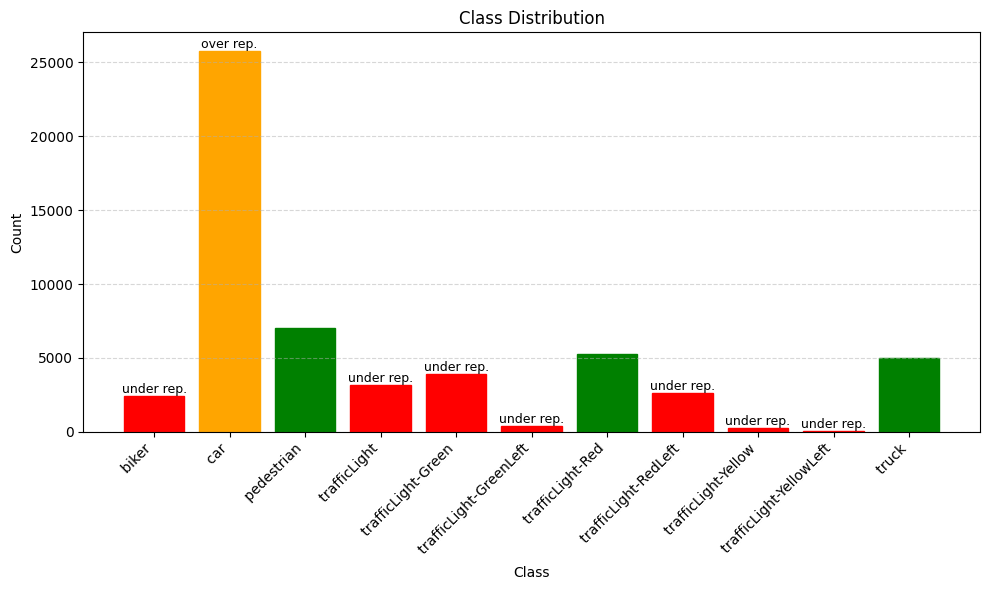

In [ ]:
# Read the CSV file
df = pd.read_csv(data_path + '_classes.csv')

# Extract class columns
class_columns = df.columns[1:]

# Calculate class counts
class_counts = df[class_columns].sum()

# Create a histogram to visualize class distribution
plt.figure(figsize=(10, 6))

# Customizing the histogram
bars = plt.bar(class_counts.index, class_counts.values)

# Adding labels and title
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')

# Rotating x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Adding grid lines
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Conditionally adding labels to specific bars
over_threshold = 10000  # Set your threshold value
under_threshold = 5000  # Set your threshold value

for i, bar in enumerate(bars):
    if class_counts.values[i] > over_threshold:
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), "over rep.",
                 ha='center', va='bottom', fontsize = 9)
        bar.set_color('orange')
    elif class_counts.values[i] < under_threshold:
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), "under rep.",
                 ha='center', va='bottom', fontsize = 9)
        bar.set_color('red')
    else:
        bar.set_color('green')

# Adjusting plot margins
plt.tight_layout()

# Displaying the histogram
plt.show()

In [ ]:
total = class_counts.values.sum()
weights = 1 - (class_counts.values / total)

# Imprimir los pesos de clase
print("Class weights:", weights)

Class weights: [0.95720471 0.53934233 0.87422621 0.94319605 0.92952732 0.99248578
 0.90524922 0.9534476  0.99558092 0.99953483 0.91020503]


# YOLO


In [ ]:
%cd /content/drive/My Drive/DeepLearning_2023/FinalProject_DeepLearning2023/

if os.path.exists("yolov5"):
    shutil.rmtree("yolov5")
    print("Carpeta eliminada con éxito.")
else:
    print("La carpeta no existe.")

!git clone https://github.com/ultralytics/yolov5
!pip install -qr yolov5/requirements.txt

%cd yolov5
from utils.plots import plot_results


/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023
La carpeta no existe.
Cloning into 'yolov5'...
remote: Enumerating objects: 15978, done.
remote: Counting objects: 100% (147/147), done.
remote: Compressing objects: 100% (71/71), done.
remote: Total 15978 (delta 89), reused 118 (delta 76), pack-reused 15831
Receiving objects: 100% (15978/15978), 14.61 MiB | 13.66 MiB/s, done.
Resolving deltas: 100% (10958/10958), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 599.6/599.6 kB 56.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.3 MB/s eta 0:00:00
/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5


In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023

# creamos las carpetas necesarias para guardar las imagenes y las etiquetas
def create_directory(path):
    if not os.path.exists(path):
        os.makedirs(path)

create_directory("train/images")
create_directory("train/labels")
create_directory("valid/images")
create_directory("valid/labels")
create_directory("test/images")
create_directory("test/labels")

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023


In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/

allImages = []
for filename in os.listdir("Data/images"):
    if filename.endswith(".jpg"):
      allImages.append(filename)

trainImages = []
valImages = []
trainLabels = []
valLabels = []
testImages = []
testLabels = []

print(len(allImages))

# let's choose which images are part of the train, validity and test:
testCount = int(0.2 * len(allImages)/10)
trainCount = len(allImages)/10 - testCount-1
valCount = int(0.2 * trainCount)
trainCount = trainCount - valCount-1

for i in range(0,int(len(allImages)/10)):
  if i < trainCount:                                    # training images
    trainImages.append(allImages[i])
  elif i >= trainCount and i<(valCount + trainCount):   # valid images
    valImages.append(allImages[i])
  else:                                                 # test images
    testImages.append(allImages[i])

print(len(trainImages), len(valImages), len(testImages))

if(len(os.listdir("train/images/")) == 0):
  # moving images
  source = "Data/images/"
  destination = "train/images/"
  for fileT in trainImages:
    shutil.move(source+fileT , destination+fileT)

  destination = "valid/images/"
  for fileT in valImages:
    shutil.move(source+fileT , destination+fileT)

  destination = "test/images/"
  for fileT in testImages:
    shutil.move(source+fileT , destination+fileT)

  # moving labels
  source = "Data/labels/"
  destination = "train/labels/"
  for fileT in trainImages:
    fileT = fileT.replace(".jpg",".txt")
    shutil.move(source+fileT , destination+fileT)

  destination = "valid/labels/"
  for fileT in valImages:
    fileT = fileT.replace(".jpg",".txt")
    shutil.move(source+fileT , destination+fileT)

  destination = "test/labels/"
  for fileT in testImages:
    fileT = fileT.replace(".jpg",".txt")
    shutil.move(source+fileT , destination+fileT)


/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023
26820
1715 429 538


In [ ]:
%cat /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Data/data.yaml

train: ../train/images
val: ../valid/images

nc: 11
names: ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']

In [ ]:
%cat /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]

In [ ]:
#customize iPython writefile so we can write variables
@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
# define number of classes based on data.yaml
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Data

with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/Data


In [ ]:
# creamos nuestro própio yolo con el numero de clases que hemos obtenido en la celda anterior

%%writetemplate /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%cat /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/custom_yolov5s.yaml


# parameters
nc: 11  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[

## NO AUGMENTATIONS

In [ ]:
# train yolov5s on custom data for 100 epochs
%%time
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/train/labels
!python /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/train.py --img 224 --batch 512 --epochs 100 --hyp /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/data/hyps/hyp.no-augmentation.yaml --data /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Data/data.yaml --cfg /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/custom_yolov5s.yaml --weights yolov5s.pt --name yolov5s_results  --cache

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/train/labels
train: weights=yolov5s.pt, cfg=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/custom_yolov5s.yaml, data=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Data/data.yaml, hyp=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/data/hyps/hyp.no-augmentation.yaml, epochs=100, batch_size=512, imgsz=224, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=../../yolov5/runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/
!python yolov5/export.py --weights /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results/weights/best.pt

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023
export: data=yolov5/data/coco128.yaml, weights=['/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript']
YOLOv5 🚀 v7.0-178-ga199480 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7273488 parameters, 0 gradients

PyTorch: starting from /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results/weights/best.pt with output shape (1, 25200, 16) (14.1 MB)

TorchScript: starting export with torch 2.0.1+cu118...
TorchScr

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/
!cp runs/train/yolov5s_results/weights/best.pt '/content/drive/My Drive/DeepLearning_2023/FinalProject_DeepLearning2023/YOLOmodel/best.pt'

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5


In [ ]:
model = torch.hub.load('ultralytics/yolov5', 'custom', project_path+'/YOLOmodel/best.pt', _verbose=False)
model.cuda()

print("")

/usr/local/lib/python3.10/dist-packages/torch/hub.py:286: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


In [ ]:
# We choose a random image among all the test images:
all_files = os.listdir(project_path + '/test/images/')
jpg_files = [file for file in all_files if file.lower().endswith('.jpg')]
random_file = random.choice(jpg_files)

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.25 µs


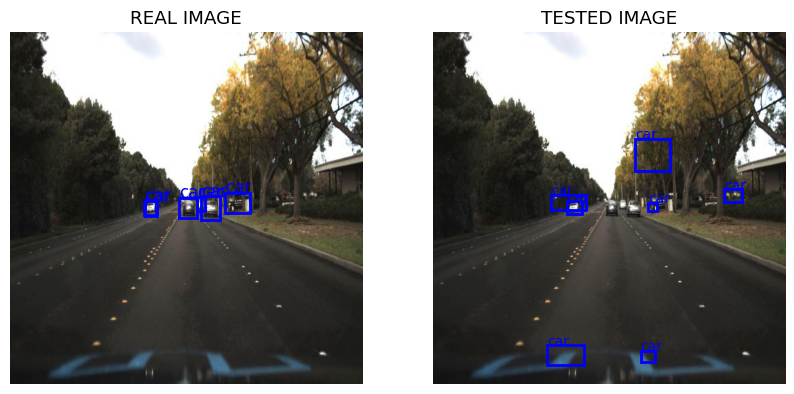

In [ ]:
%matplotlib inline

colors = ['red', 'blue', 'green', 'orange', 'purple', 'yellow', 'cyan', 'magenta', 'gray', 'brown', 'pink']

# Open the image using PIL
image = Image.open(project_path + '/test/images/' + random_file)

# We creat the plot to visualize the real objects and another to see the detected objects
fig = plt.figure(figsize=(10, 5))
axs = fig.subplots(1, 2)

# Real image
random_file_txt = random_file.replace(".jpg",".txt")
columns = ['class', 'center_x', 'center_y', 'dist_x', 'dist_y']
df = pd.read_csv(project_path + '/test/labels/' + random_file_txt, delimiter=' ', names=columns)

classes = ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']

axs[0].imshow(image)
axs[0].set_title('REAL IMAGE')
axs[0].axis('off')

if len(df) > 0:
  width, height = image.size
  for i in range(len(df)):
    xmin = (df['center_x'][i] - df['dist_x'][i]/2) * width
    ymin = (df['center_y'][i] - df['dist_y'][i]/2) * height
    x = df['dist_x'][i] * width
    y = df['dist_y'][i] * height
    rect = plt.Rectangle((xmin, ymin), x, y, edgecolor=colors[df['class'][i]], linewidth=2, facecolor='none')
    axs[0].add_patch(rect)
    text_x = xmin
    text_y = ymin - 0.1
    axs[0].text(text_x, text_y, classes[df['class'][i]], fontsize=12, color=colors[df['class'][i]])
else:
  print("No objects.")

# Image tested
%time
detections = model(image).pandas().xyxy[0]
axs[1].imshow(image)
axs[1].set_title('TESTED IMAGE')
axs[1].axis('off')

if len(detections) > 0:
  for i in range(len(detections)):
    xmin = detections['xmin'][i]
    ymin = detections['ymin'][i]
    xmax = detections['xmax'][i]
    ymax = detections['ymax'][i]

    rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, edgecolor=colors[detections['class'][i]], linewidth=2, facecolor='none')
    axs[1].add_patch(rect)

    text_x = xmin
    text_y = ymin - 0.1
    axs[1].text(text_x, text_y, detections['name'][i], fontsize=10, color=colors[detections['class'][i]])
else:
  print("No detection.")

plt.show()

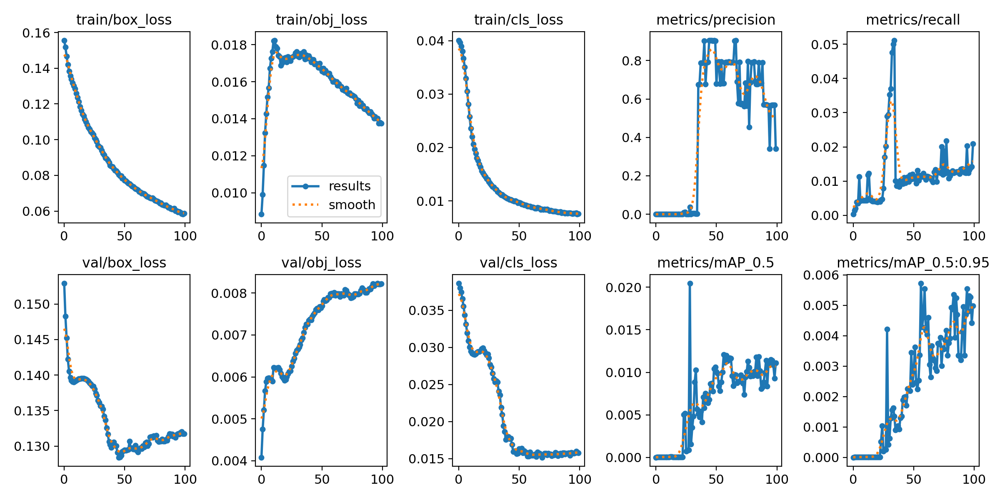

In [ ]:
from IPython.display import Image  # to display images

plot_results(file = '/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results/results.csv')
Image(filename='/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results/results.png', width = 1000)

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 224 --source ../test/images

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[224, 224], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-178-ga199480 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7273488 parameters, 0 gradients
image 1/538 /content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/test/images/1478020836210658259_jpg.rf.a39f0e2f012c51fdc2e5963e80d47ad4.jpg: 224x22

## TRANSFORMATIONS ADDED

In [ ]:
from PIL import Image

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023

create_directory("Transformation/train/images")
create_directory("Transformation/valid/images")
create_directory("Transformation/test/images")
create_directory("Transformation/train/labels")
create_directory("Transformation/valid/labels")
create_directory("Transformation/test/labels")

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023


In [ ]:
def apply_data_augmentation(image_path, output_path_image, annotation_path, output_path_annotation):
    # Definir las transformaciones de aumento de datos
    transform = transforms.Compose([
        transforms.RandomRotation(degrees=[90, 90]),
        transforms.ColorJitter(brightness=0.2, contrast=0.2)
    ])

    # Leer la imagen y las anotaciones
    image = Image.open(image_path)
    annotation = open(annotation_path, 'r').readlines()

    # Convertir las anotaciones al formato de albumentations
    bboxes = []
    category_ids = []
    for line in annotation:
        class_label, x, y, w, h = line.strip().split()
        x, y, w, h = float(x), float(y), float(w), float(h)
        bboxes.append([x, y, w, h])
        category_ids.append(int(class_label))

    # Aplicar las transformaciones de aumento de datos
    augmented_image = transform(image)

    # Aplicar las mismas transformaciones de aumento de datos a las anotaciones
    augmented_bboxes = []
    for bbox in bboxes:
        x, y, width, height = bbox
        augmented_bboxes.append((y, 1-x, height, width))

    # Guardar la imagen y las anotaciones aumentadas
    augmented_image.save(output_path_image)
    with open(output_path_annotation, 'w') as f:
        for bbox, category_id in zip(augmented_bboxes, category_ids):
            x, y, w, h = bbox
            line = f"{category_id} {x} {y} {w} {h}"
            f.write(line + '\n')

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/

if(len(os.listdir("Transformation/train/images/")) == 0):
  # transforming labels and images
  source_im = "train/images/"
  destination_im = "Transformation/train/images/"
  source_lbl = "train/labels/"
  destination_lbl = "Transformation/train/labels/"
  for i, (fileT) in enumerate(trainImages):
    filetxt = fileT.replace(".jpg",".txt")
    if (i+1) % 2 == 0:
      apply_data_augmentation(source_im+fileT, destination_im+fileT, source_lbl+filetxt, destination_lbl+filetxt)
    else:
      shutil.copy(source_im+fileT, destination_im+fileT)
      shutil.copy(source_lbl+filetxt, destination_lbl+filetxt)

  source_im = "valid/images/"
  destination_im = "Transformation/valid/images/"
  source_lbl = "valid/labels/"
  destination_lbl = "Transformation/valid/labels/"
  for fileT in valImages:
    filetxt = fileT.replace(".jpg",".txt")
    filetxt = fileT.replace(".jpg",".txt")
    shutil.copy(source_im+fileT, destination_im+fileT)
    shutil.copy(source_lbl+filetxt, destination_lbl+filetxt)

  source_im = "test/images/"
  destination_im = "Transformation/test/images/"
  source_lbl = "test/labels/"
  destination_lbl = "Transformation/test/labels/"
  for fileT in testImages:
    filetxt = fileT.replace(".jpg",".txt")
    apply_data_augmentation(source_im+fileT, destination_im+fileT, source_lbl+filetxt, destination_lbl+filetxt)

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023


In [ ]:
%%writetemplate /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Transformation/data_trans.yaml
train: /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Transformation/train/images
val: /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Transformation/valid/images

nc: 11
names: ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']

In [ ]:
%cat /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Transformation/data_trans.yaml

train: /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Transformation/train/images
val: /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Transformation/valid/images

nc: 11
names: ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']


In [ ]:
%%time
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Transformation/train/labels
!python /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/train.py --img 224 --batch 512 --epochs 100 --hyp /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/data/hyps/hyp.no-augmentation.yaml --data /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Transformation/data_trans.yaml --cfg /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/custom_yolov5s.yaml --weights yolov5s.pt --name yolov5s_results_transformation  --cache

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/Transformation/train/labels
train: weights=yolov5s.pt, cfg=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/custom_yolov5s.yaml, data=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Transformation/data_trans.yaml, hyp=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/data/hyps/hyp.no-augmentation.yaml, epochs=100, batch_size=512, imgsz=224, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=../../../yolov5/runs/train, name=yolov5s_results_transformation, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/
!python yolov5/export.py --weights /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_transformation/weights/best.pt

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023
export: data=yolov5/data/coco128.yaml, weights=['/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_transformation/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript']
YOLOv5 🚀 v7.0-178-ga199480 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7273488 parameters, 0 gradients

PyTorch: starting from /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_transformation/weights/best.pt with output shape (1, 25200, 16) (14.1 MB)

TorchScript: starting export with

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/
!cp runs/train/yolov5s_results_transformation/weights/best.pt '/content/drive/My Drive/DeepLearning_2023/FinalProject_DeepLearning2023/YOLOmodel/best_transformation.pt'

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5


In [ ]:
model_transformation = torch.hub.load('ultralytics/yolov5', 'custom', project_path+'/YOLOmodel/best_transformation.pt', _verbose=False)
model_transformation.cuda()

print("")

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master


CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 4.53 µs


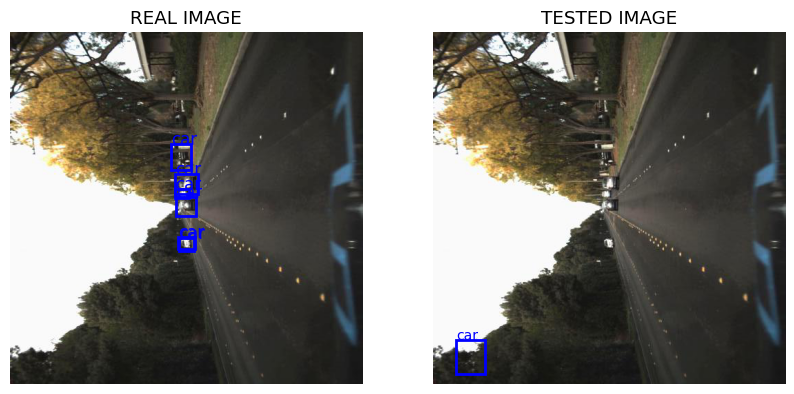

In [ ]:
%matplotlib inline

colors = ['red', 'blue', 'green', 'orange', 'purple', 'yellow', 'cyan', 'magenta', 'gray', 'brown', 'pink']

# Open the image using PIL
transformation_path = '/content/drive/My Drive/DeepLearning_2023/FinalProject_DeepLearning2023/Transformation'
image = Image.open(transformation_path + '/test/images/' + random_file)

# We creat the plot to visualize the real objects and another to see the detected objects
fig = plt.figure(figsize=(10, 5))
axs = fig.subplots(1, 2)

# Real image
random_file_txt = random_file.replace(".jpg",".txt")
columns = ['class', 'center_x', 'center_y', 'dist_x', 'dist_y']
df = pd.read_csv(transformation_path + '/test/labels/' + random_file_txt, delimiter=' ', names=columns)

classes = ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']

axs[0].imshow(image)
axs[0].set_title('REAL IMAGE')
axs[0].axis('off')

if len(df) > 0:
  width, height = image.size
  for i in range(len(df)):
    xmin = (df['center_x'][i] - df['dist_x'][i]/2) * width
    ymin = (df['center_y'][i] - df['dist_y'][i]/2) * height
    x = df['dist_x'][i] * width
    y = df['dist_y'][i] * height
    rect = plt.Rectangle((xmin, ymin), x, y, edgecolor=colors[df['class'][i]], linewidth=2, facecolor='none')
    axs[0].add_patch(rect)
    text_x = xmin
    text_y = ymin - 0.1
    axs[0].text(text_x, text_y, classes[df['class'][i]], fontsize=12, color=colors[df['class'][i]])
else:
  print("No objects.")

# Image tested
%time
detections = model_transformation(image).pandas().xyxy[0]
axs[1].imshow(image)
axs[1].set_title('TESTED IMAGE')
axs[1].axis('off')

if len(detections) > 0:
  for i in range(len(detections)):
    xmin = detections['xmin'][i]
    ymin = detections['ymin'][i]
    xmax = detections['xmax'][i]
    ymax = detections['ymax'][i]

    rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, edgecolor=colors[detections['class'][i]], linewidth=2, facecolor='none')
    axs[1].add_patch(rect)

    text_x = xmin
    text_y = ymin - 0.1
    axs[1].text(text_x, text_y, detections['name'][i], fontsize=10, color=colors[detections['class'][i]])
else:
  print("No detection.")

plt.show()

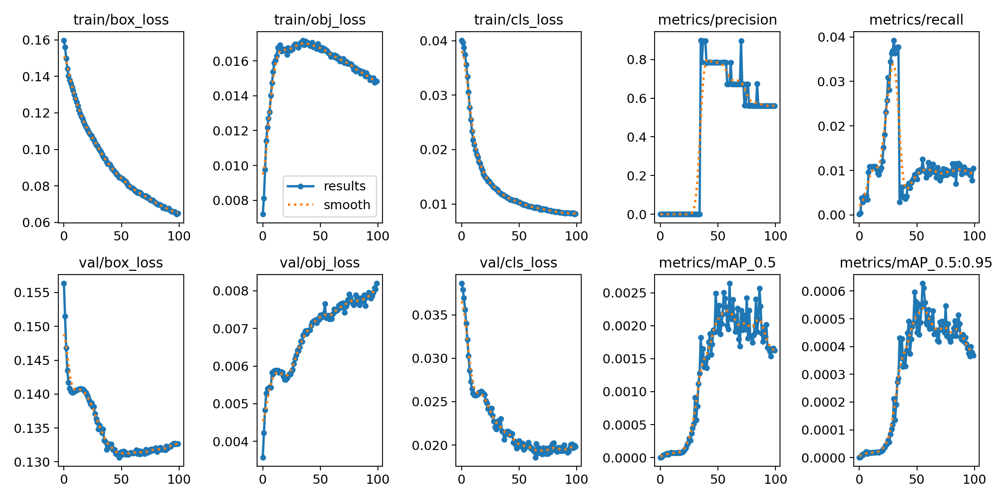

In [ ]:
from IPython.display import Image  # to display images

plot_results(file = '/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_transformation/results.csv')
Image(filename='/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_transformation/results.png', width = 1000)

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/
!python detect.py --weights runs/train/yolov5s_results_transformation/weights/best.pt --img 224 --source /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Transformation/test/images

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5
detect: weights=['runs/train/yolov5s_results_transformation/weights/best.pt'], source=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Transformation/test/images, data=data/coco128.yaml, imgsz=[224, 224], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-178-ga199480 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7273488 parameters, 0 gradients
image 1/538 /content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_D

## CHANGE SIZE

In [ ]:
def change_size(input_path, output_path, size):
    transform = transforms.Compose([
        transforms.Resize((size, size)),
        transforms.ToTensor()
    ])

    # Leer la imagen y las anotaciones
    image = Image.open(input_path)
    new_image = transform(image)
    new_image = transforms.ToPILImage()(new_image)
    new_image.save(output_path)

### MORE SIZE

In [ ]:
from PIL import Image

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023

create_directory("MoreSize/train/images")
create_directory("MoreSize/valid/images")
create_directory("MoreSize/test/images")
create_directory("MoreSize/train/labels")
create_directory("MoreSize/valid/labels")
create_directory("MoreSize/test/labels")

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023


In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/

if(len(os.listdir("MoreSize/train/images/")) == 0):
  # transforming labels and images
  source_im = "train/images/"
  destination_im = "MoreSize/train/images/"
  source_lbl = "train/labels/"
  destination_lbl = "MoreSize/train/labels/"
  for i, (fileT) in enumerate(trainImages):
    filetxt = fileT.replace(".jpg",".txt")
    if (i+1) % 2 == 0:
      change_size(source_im+fileT, destination_im+fileT, 512)
    else:
      shutil.copy(source_im+fileT, destination_im+fileT)
    shutil.copy(source_lbl+filetxt, destination_lbl+filetxt)

  source_im = "valid/images/"
  destination_im = "MoreSize/valid/images/"
  source_lbl = "valid/labels/"
  destination_lbl = "MoreSize/valid/labels/"
  for fileT in valImages:
    filetxt = fileT.replace(".jpg",".txt")
    filetxt = fileT.replace(".jpg",".txt")
    shutil.copy(source_im+fileT, destination_im+fileT)
    shutil.copy(source_lbl+filetxt, destination_lbl+filetxt)

  source_im = "test/images/"
  destination_im = "MoreSize/test/images/"
  source_lbl = "test/labels/"
  destination_lbl = "MoreSize/test/labels/"
  for fileT in testImages:
    filetxt = fileT.replace(".jpg",".txt")
    change_size(source_im+fileT, destination_im+fileT, 512)
    shutil.copy(source_lbl+filetxt, destination_lbl+filetxt)

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023


In [ ]:
%%writetemplate /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/MoreSize/data_trans.yaml
train: /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/MoreSize/train/images
val: /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/MoreSize/valid/images

nc: 11
names: ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']

In [ ]:
%cat /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/MoreSize/data_trans.yaml

train: /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/MoreSize/train/images
val: /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/MoreSize/valid/images

nc: 11
names: ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']


In [ ]:
%%time
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/MoreSize/train/labels
!python /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/train.py --img 512 --batch 64 --epochs 100 --hyp /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/data/hyps/hyp.no-augmentation.yaml --data /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/MoreSize/data_trans.yaml --cfg /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/custom_yolov5s.yaml --weights yolov5s.pt --name yolov5s_results_moresize  --cache

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/MoreSize/train/labels
train: weights=yolov5s.pt, cfg=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/custom_yolov5s.yaml, data=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/MoreSize/data_trans.yaml, hyp=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/data/hyps/hyp.no-augmentation.yaml, epochs=100, batch_size=64, imgsz=512, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=../../../yolov5/runs/train, name=yolov5s_results_moresize, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbo

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/
!python yolov5/export.py --weights /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_moresize/weights/best.pt

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023
export: data=yolov5/data/coco128.yaml, weights=['/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_moresize/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript']
YOLOv5 🚀 v7.0-178-ga199480 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7273488 parameters, 0 gradients

PyTorch: starting from /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_moresize/weights/best.pt with output shape (1, 25200, 16) (14.2 MB)

TorchScript: starting export with torch 2.0.1

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/
!cp runs/train/yolov5s_results_moresize/weights/best.pt '/content/drive/My Drive/DeepLearning_2023/FinalProject_DeepLearning2023/YOLOmodel/best_moresize.pt'

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5


In [ ]:
model_moresize = torch.hub.load('ultralytics/yolov5', 'custom', project_path+'/YOLOmodel/best_moresize.pt', _verbose=False)
model_moresize.cuda()

print("")

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master


CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.44 µs


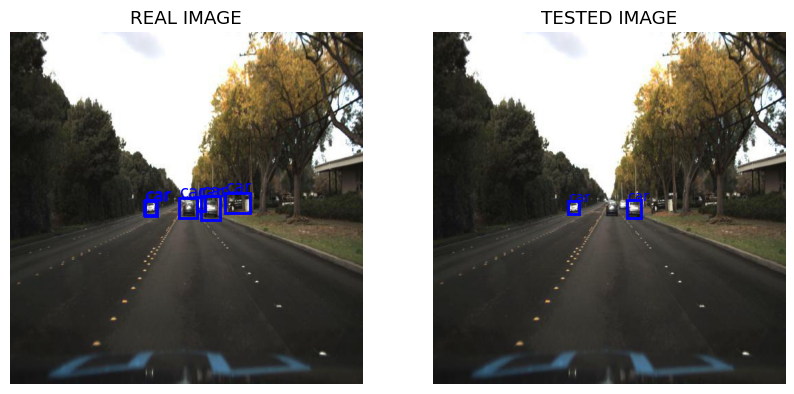

In [ ]:
%matplotlib inline
from PIL import Image

colors = ['red', 'blue', 'green', 'orange', 'purple', 'yellow', 'cyan', 'magenta', 'gray', 'brown', 'pink']

# Open the image using PIL
size_path = '/content/drive/My Drive/DeepLearning_2023/FinalProject_DeepLearning2023/MoreSize'
image = Image.open(size_path + '/test/images/' + random_file)

# We creat the plot to visualize the real objects and another to see the detected objects
fig = plt.figure(figsize=(10, 5))
axs = fig.subplots(1, 2)

# Real image
random_file_txt = random_file.replace(".jpg",".txt")
columns = ['class', 'center_x', 'center_y', 'dist_x', 'dist_y']
df = pd.read_csv(size_path + '/test/labels/' + random_file_txt, delimiter=' ', names=columns)

classes = ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']

axs[0].imshow(image)
axs[0].set_title('REAL IMAGE')
axs[0].axis('off')

if len(df) > 0:
  width, height = image.size
  for i in range(len(df)):
    xmin = (df['center_x'][i] - df['dist_x'][i]/2) * width
    ymin = (df['center_y'][i] - df['dist_y'][i]/2) * height
    x = df['dist_x'][i] * width
    y = df['dist_y'][i] * height
    rect = plt.Rectangle((xmin, ymin), x, y, edgecolor=colors[df['class'][i]], linewidth=2, facecolor='none')
    axs[0].add_patch(rect)
    text_x = xmin
    text_y = ymin - 0.1
    axs[0].text(text_x, text_y, classes[df['class'][i]], fontsize=12, color=colors[df['class'][i]])
else:
  print("No objects.")

# Image tested
%time
detections = model_moresize(image).pandas().xyxy[0]
axs[1].imshow(image)
axs[1].set_title('TESTED IMAGE')
axs[1].axis('off')

if len(detections) > 0:
  for i in range(len(detections)):
    xmin = detections['xmin'][i]
    ymin = detections['ymin'][i]
    xmax = detections['xmax'][i]
    ymax = detections['ymax'][i]

    rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, edgecolor=colors[detections['class'][i]], linewidth=2, facecolor='none')
    axs[1].add_patch(rect)

    text_x = xmin
    text_y = ymin - 0.1
    axs[1].text(text_x, text_y, detections['name'][i], fontsize=10, color=colors[detections['class'][i]])
else:
  print("No detection.")

plt.show()

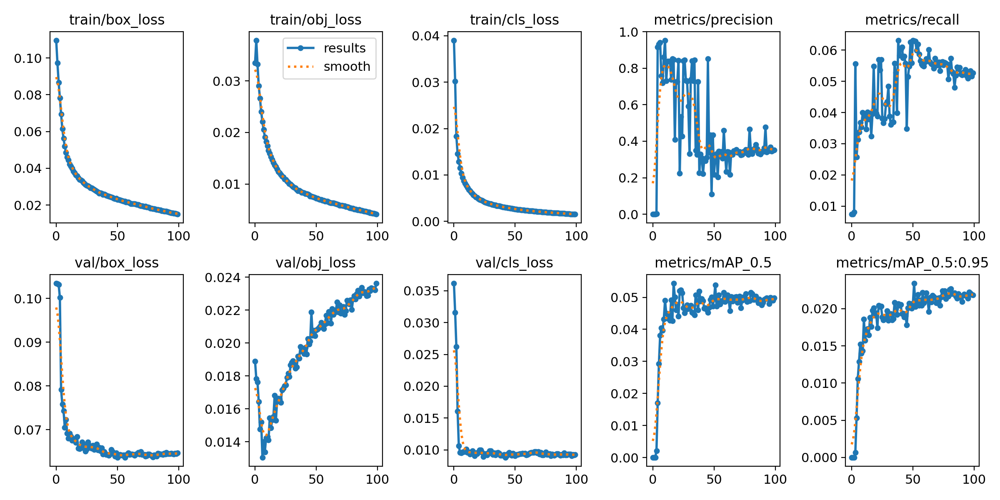

In [ ]:
from IPython.display import Image  # to display images

plot_results(file = '/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_moresize/results.csv')
Image(filename='/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_moresize/results.png', width = 1000)

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/
!python detect.py --weights runs/train/yolov5s_results_moresize/weights/best.pt --img 512 --source /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/MoreSize/test/images

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5
detect: weights=['runs/train/yolov5s_results_moresize/weights/best.pt'], source=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/MoreSize/test/images, data=data/coco128.yaml, imgsz=[512, 512], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-178-ga199480 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7273488 parameters, 0 gradients
image 1/538 /content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2

### LESS SIZE

In [ ]:
from PIL import Image

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023

create_directory("LessSize/train/images")
create_directory("LessSize/valid/images")
create_directory("LessSize/test/images")
create_directory("LessSize/train/labels")
create_directory("LessSize/valid/labels")
create_directory("LessSize/test/labels")

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023


In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/

if(len(os.listdir("LessSize/train/images/")) == 0):
  # transforming labels and images
  source_im = "train/images/"
  destination_im = "LessSize/train/images/"
  source_lbl = "train/labels/"
  destination_lbl = "LessSize/train/labels/"
  for i, (fileT) in enumerate(trainImages):
    filetxt = fileT.replace(".jpg",".txt")
    if (i+1) % 2 == 0:
      change_size(source_im+fileT, destination_im+fileT, 128)
    else:
      shutil.copy(source_im+fileT, destination_im+fileT)
    shutil.copy(source_lbl+filetxt, destination_lbl+filetxt)

  source_im = "valid/images/"
  destination_im = "LessSize/valid/images/"
  source_lbl = "valid/labels/"
  destination_lbl = "LessSize/valid/labels/"
  for fileT in valImages:
    filetxt = fileT.replace(".jpg",".txt")
    filetxt = fileT.replace(".jpg",".txt")
    shutil.copy(source_im+fileT, destination_im+fileT)
    shutil.copy(source_lbl+filetxt, destination_lbl+filetxt)

  source_im = "test/images/"
  destination_im = "LessSize/test/images/"
  source_lbl = "test/labels/"
  destination_lbl = "LessSize/test/labels/"
  for fileT in testImages:
    filetxt = fileT.replace(".jpg",".txt")
    change_size(source_im+fileT, destination_im+fileT, 128)
    shutil.copy(source_lbl+filetxt, destination_lbl+filetxt)

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023


In [ ]:
%%writetemplate /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/LessSize/data_trans.yaml
train: /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/LessSize/train/images
val: /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/LessSize/valid/images

nc: 11
names: ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']

In [ ]:
%cat /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/LessSize/data_trans.yaml

train: /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/LessSize/train/images
val: /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/LessSize/valid/images

nc: 11
names: ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']


In [ ]:
%%time
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/LessSize/train/labels
!python /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/train.py --img 128 --batch 512 --epochs 100 --hyp /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/data/hyps/hyp.no-augmentation.yaml --data /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/LessSize/data_trans.yaml --cfg /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/custom_yolov5s.yaml --weights yolov5s.pt --name yolov5s_results_lesssize  --cache

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/LessSize/train/labels
train: weights=yolov5s.pt, cfg=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/custom_yolov5s.yaml, data=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/LessSize/data_trans.yaml, hyp=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/data/hyps/hyp.no-augmentation.yaml, epochs=100, batch_size=512, imgsz=128, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=../../../yolov5/runs/train, name=yolov5s_results_lesssize, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bb

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/
!python yolov5/export.py --weights /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_lesssize/weights/best.pt

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023
export: data=yolov5/data/coco128.yaml, weights=['/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_lesssize/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript']
YOLOv5 🚀 v7.0-178-ga199480 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7273488 parameters, 0 gradients

PyTorch: starting from /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_lesssize/weights/best.pt with output shape (1, 25200, 16) (14.1 MB)

TorchScript: starting export with torch 2.0.1

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/
!cp runs/train/yolov5s_results_lesssize/weights/best.pt '/content/drive/My Drive/DeepLearning_2023/FinalProject_DeepLearning2023/YOLOmodel/best_lesssize.pt'

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5


In [ ]:
model_lesssize = torch.hub.load('ultralytics/yolov5', 'custom', project_path+'/YOLOmodel/best_lesssize.pt', _verbose=False)
model_lesssize.cuda()

print("")

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master


CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 4.77 µs
No detection.


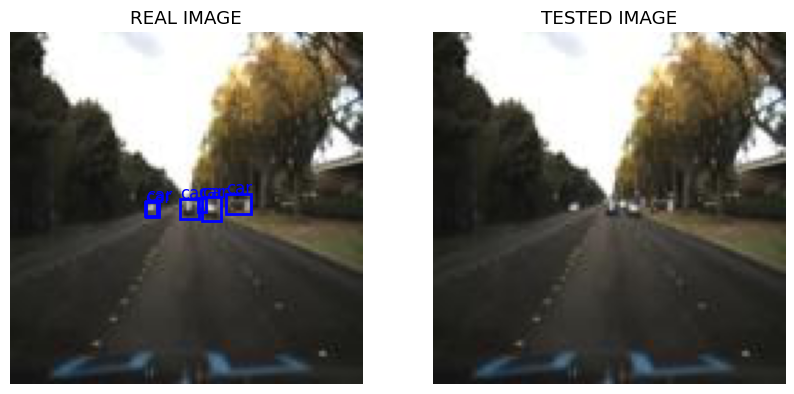

In [ ]:
%matplotlib inline

colors = ['red', 'blue', 'green', 'orange', 'purple', 'yellow', 'cyan', 'magenta', 'gray', 'brown', 'pink']

# Open the image using PIL
size_path = '/content/drive/My Drive/DeepLearning_2023/FinalProject_DeepLearning2023/LessSize'
image = Image.open(size_path + '/test/images/' + random_file)

# We creat the plot to visualize the real objects and another to see the detected objects
fig = plt.figure(figsize=(10, 5))
axs = fig.subplots(1, 2)

# Real image
random_file_txt = random_file.replace(".jpg",".txt")
columns = ['class', 'center_x', 'center_y', 'dist_x', 'dist_y']
df = pd.read_csv(size_path + '/test/labels/' + random_file_txt, delimiter=' ', names=columns)

classes = ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']

axs[0].imshow(image)
axs[0].set_title('REAL IMAGE')
axs[0].axis('off')

if len(df) > 0:
  width, height = image.size
  for i in range(len(df)):
    xmin = (df['center_x'][i] - df['dist_x'][i]/2) * width
    ymin = (df['center_y'][i] - df['dist_y'][i]/2) * height
    x = df['dist_x'][i] * width
    y = df['dist_y'][i] * height
    rect = plt.Rectangle((xmin, ymin), x, y, edgecolor=colors[df['class'][i]], linewidth=2, facecolor='none')
    axs[0].add_patch(rect)
    text_x = xmin
    text_y = ymin - 0.1
    axs[0].text(text_x, text_y, classes[df['class'][i]], fontsize=12, color=colors[df['class'][i]])
else:
  print("No objects.")

# Image tested
%time
detections = model_lesssize(image).pandas().xyxy[0]
axs[1].imshow(image)
axs[1].set_title('TESTED IMAGE')
axs[1].axis('off')

if len(detections) > 0:
  for i in range(len(detections)):
    xmin = detections['xmin'][i]
    ymin = detections['ymin'][i]
    xmax = detections['xmax'][i]
    ymax = detections['ymax'][i]

    rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, edgecolor=colors[detections['class'][i]], linewidth=2, facecolor='none')
    axs[1].add_patch(rect)

    text_x = xmin
    text_y = ymin - 0.1
    axs[1].text(text_x, text_y, detections['name'][i], fontsize=10, color=colors[detections['class'][i]])
else:
  print("No detection.")

plt.show()

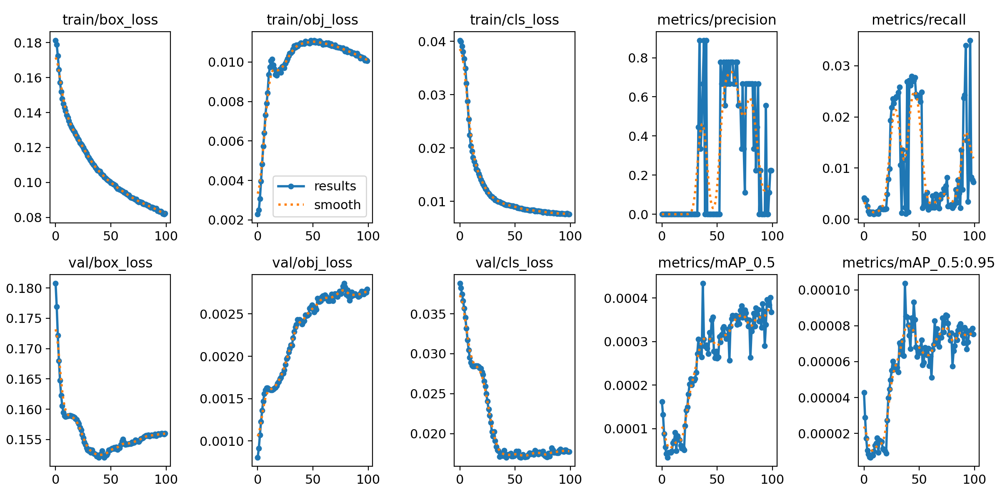

In [ ]:
from IPython.display import Image # to display images

plot_results(file = '/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_lesssize/results.csv')
Image(filename='/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_lesssize/results.png', width = 1000)

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/
!python detect.py --weights runs/train/yolov5s_results_lesssize/weights/best.pt --img 128 --source /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/LessSize/test/images

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5
detect: weights=['runs/train/yolov5s_results_lesssize/weights/best.pt'], source=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/LessSize/test/images, data=data/coco128.yaml, imgsz=[128, 128], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-178-ga199480 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7273488 parameters, 0 gradients
image 1/538 /content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2

## AUGMENTATIONS

In [ ]:
from PIL import Image

In [ ]:
%cat /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/data/hyps/hyp.scratch-low.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license
# Hyperparameters for low-augmentation COCO training from scratch
# python train.py --batch 64 --cfg yolov5n6.yaml --weights '' --data coco.yaml --img 640 --epochs 300 --linear
# See tutorials for hyperparameter evolution https://github.com/ultralytics/yolov5#tutorials

lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.01  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok)
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.5  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 1.0  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.20  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0

In [ ]:
%%writetemplate /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/data/hyps/custom_hyp.yaml

# Añadimos los pesos que hemos calculado anteriormente, para hacer que nuestro modelo le de más o menos importancia a cada loss según la clase

lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.01  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok)
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.5  # cls loss gain
cls_pw: 1.0 # cls BCELoss positive_weight
obj: 1.0  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.20  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 0.0  # image rotation (+/- deg)
translate: 0.1  # image translation (+/- fraction)
scale: 0.5  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.0  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.0  # image mixup (probability)
copy_paste: 0.0  # segment copy-paste (probability)
class_weights:
  - 0.9572
  - 0.53934
  - 0.87423
  - 0.9432
  - 0.92953
  - 0.99249
  - 0.90525
  - 0.95345
  - 0.99558
  - 0.99953
  - 0.91021

In [ ]:
%cat /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/utils/loss.py

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license
"""
Loss functions
"""

import torch
import torch.nn as nn

from utils.metrics import bbox_iou
from utils.torch_utils import de_parallel


def smooth_BCE(eps=0.1):  # https://github.com/ultralytics/yolov3/issues/238#issuecomment-598028441
    # return positive, negative label smoothing BCE targets
    return 1.0 - 0.5 * eps, 0.5 * eps


class BCEBlurWithLogitsLoss(nn.Module):
    # BCEwithLogitLoss() with reduced missing label effects.
    def __init__(self, alpha=0.05):
        super().__init__()
        self.loss_fcn = nn.BCEWithLogitsLoss(reduction='none')  # must be nn.BCEWithLogitsLoss()
        self.alpha = alpha

    def forward(self, pred, true):
        loss = self.loss_fcn(pred, true)
        pred = torch.sigmoid(pred)  # prob from logits
        dx = pred - true  # reduce only missing label effects
        # dx = (pred - true).abs()  # reduce missing label and false label effects
        alpha_factor = 1 - torch.exp((dx - 1) / (sel

In [ ]:
path = "/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/utils/"
archivo = path + "loss.py"

# Comando %cat para mostrar el contenido del archivo
comando_cat = "cat /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/utils/loss.py"
# Ejecutar el comando y capturar la salida
salida_cat = subprocess.check_output(comando_cat, shell=True).decode()

# Modificar una línea específica
linea_modificada = "        BCEcls = nn.BCEWithLogitsLoss(weight=torch.tensor([h['class_weights']], device=device), pos_weight=torch.tensor([h['cls_pw']], device=device))"
salida_modificada = ""
for linea in salida_cat.split("\n"):
    if linea.startswith("        BCEcls = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([h['cls_pw']], device=device))"):
        salida_modificada += linea_modificada + "\n"
    else:
        salida_modificada += linea + "\n"

with open(archivo, "w") as archivo:
    archivo.write(salida_modificada)

In [ ]:
%cat /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/utils/loss.py

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license
"""
Loss functions
"""

import torch
import torch.nn as nn

from utils.metrics import bbox_iou
from utils.torch_utils import de_parallel


def smooth_BCE(eps=0.1):  # https://github.com/ultralytics/yolov3/issues/238#issuecomment-598028441
    # return positive, negative label smoothing BCE targets
    return 1.0 - 0.5 * eps, 0.5 * eps


class BCEBlurWithLogitsLoss(nn.Module):
    # BCEwithLogitLoss() with reduced missing label effects.
    def __init__(self, alpha=0.05):
        super().__init__()
        self.loss_fcn = nn.BCEWithLogitsLoss(reduction='none')  # must be nn.BCEWithLogitsLoss()
        self.alpha = alpha

    def forward(self, pred, true):
        loss = self.loss_fcn(pred, true)
        pred = torch.sigmoid(pred)  # prob from logits
        dx = pred - true  # reduce only missing label effects
        # dx = (pred - true).abs()  # reduce missing label and false label effects
        alpha_factor = 1 - torch.exp((dx - 1) / (sel

In [ ]:
%%time
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/train/labels
!python /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/train.py --img 224 --batch 512 --epochs 100 --hyp /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/data/hyps/custom_hyp.yaml --data /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Data/data.yaml --weights yolov5s.pt --cfg /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/custom_yolov5s.yaml --name yolov5s_results_augmentation  --cache

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/train/labels
train: weights=yolov5s.pt, cfg=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/custom_yolov5s.yaml, data=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Data/data.yaml, hyp=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/data/hyps/custom_hyp.yaml, epochs=100, batch_size=512, imgsz=224, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=../../yolov5/runs/train, name=yolov5s_results_augmentation, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_al

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/
!python yolov5/export.py --weights /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_augmentation/weights/best.pt

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023
export: data=yolov5/data/coco128.yaml, weights=['/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_augmentation/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript']
YOLOv5 🚀 v7.0-178-ga199480 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7273488 parameters, 0 gradients

PyTorch: starting from /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_augmentation/weights/best.pt with output shape (1, 25200, 16) (14.1 MB)

TorchScript: starting export with tor

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/
!cp runs/train/yolov5s_results_augmentation/weights/best.pt '/content/drive/My Drive/DeepLearning_2023/FinalProject_DeepLearning2023/YOLOmodel/best_augmentation.pt'

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5


In [ ]:
model_augmentation = torch.hub.load('ultralytics/yolov5', 'custom', project_path+'/YOLOmodel/best_augmentation.pt', _verbose=False)
model_augmentation.cuda()

print("")

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master


CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.39 µs


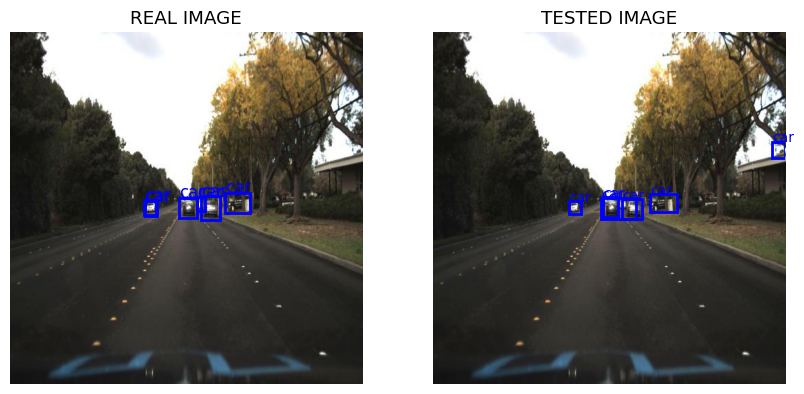

In [ ]:
%matplotlib inline
from PIL import Image
colors = ['red', 'blue', 'green', 'orange', 'purple', 'yellow', 'cyan', 'magenta', 'gray', 'brown', 'pink']

# Open the image using PIL
image = Image.open(project_path + '/test/images/' + random_file)

# We creat the plot to visualize the real objects and another to see the detected objects
fig = plt.figure(figsize=(10, 5))
axs = fig.subplots(1, 2)

# Real image
random_file_txt = random_file.replace(".jpg",".txt")
columns = ['class', 'center_x', 'center_y', 'dist_x', 'dist_y']
df = pd.read_csv(project_path + '/test/labels/' + random_file_txt, delimiter=' ', names=columns)

classes = ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']

axs[0].imshow(image)
axs[0].set_title('REAL IMAGE')
axs[0].axis('off')

if len(df) > 0:
  width, height = image.size
  for i in range(len(df)):
    xmin = (df['center_x'][i] - df['dist_x'][i]/2) * width
    ymin = (df['center_y'][i] - df['dist_y'][i]/2) * height
    x = df['dist_x'][i] * width
    y = df['dist_y'][i] * height
    rect = plt.Rectangle((xmin, ymin), x, y, edgecolor=colors[df['class'][i]], linewidth=2, facecolor='none')
    axs[0].add_patch(rect)
    text_x = xmin
    text_y = ymin - 0.1
    axs[0].text(text_x, text_y, classes[df['class'][i]], fontsize=12, color=colors[df['class'][i]])
else:
  print("No objects.")

# Image tested
%time
detections = model_augmentation(image).pandas().xyxy[0]
axs[1].imshow(image)
axs[1].set_title('TESTED IMAGE')
axs[1].axis('off')

if len(detections) > 0:
  for i in range(len(detections)):
    xmin = detections['xmin'][i]
    ymin = detections['ymin'][i]
    xmax = detections['xmax'][i]
    ymax = detections['ymax'][i]

    rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, edgecolor=colors[detections['class'][i]], linewidth=2, facecolor='none')
    axs[1].add_patch(rect)

    text_x = xmin
    text_y = ymin - 0.1
    axs[1].text(text_x, text_y, detections['name'][i], fontsize=10, color=colors[detections['class'][i]])
else:
  print("No detection.")

plt.show()

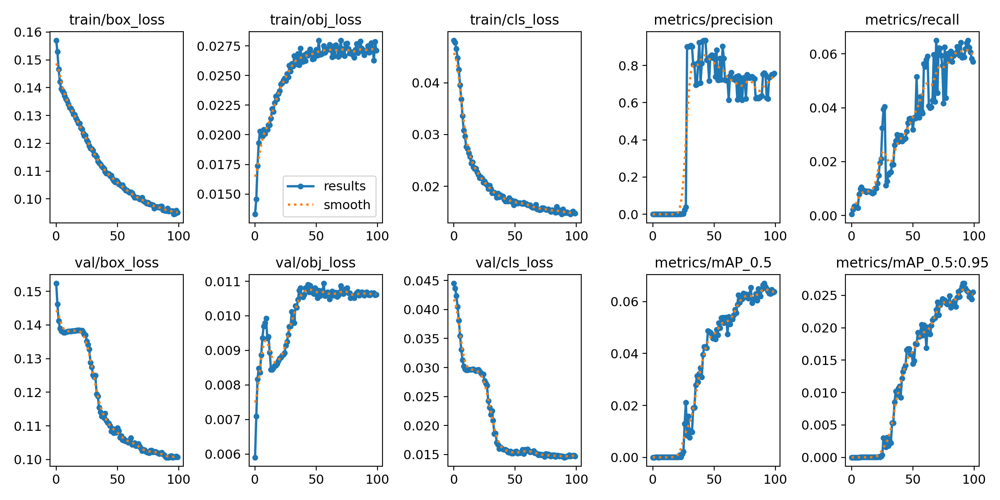

In [ ]:
from IPython.display import Image  # to display images

plot_results(file = '/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_augmentation/results.csv')
Image(filename='/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_augmentation/results.png', width = 1000)

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/
!python detect.py --weights runs/train/yolov5s_results_augmentation/weights/best.pt --img 224 --source ../test/images

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5
detect: weights=['runs/train/yolov5s_results_augmentation/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[224, 224], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-178-ga199480 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7273488 parameters, 0 gradients
image 1/538 /content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/test/images/1478020836210658259_jpg.rf.a39f0e2f012c51fdc2e5963e80d47a

Change SGD to ADAM

In [ ]:
%%time
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/train/labels
!python /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/train.py --img 224 --batch 512 --epochs 100 --hyp /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/data/hyps/custom_hyp.yaml --optimizer Adam --data /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Data/data.yaml --weights yolov5s.pt --cfg /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/custom_yolov5s.yaml --name yolov5s_results_augmentation_adam  --cache

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/train/labels
train: weights=yolov5s.pt, cfg=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/models/custom_yolov5s.yaml, data=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/Data/data.yaml, hyp=/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/data/hyps/custom_hyp.yaml, epochs=100, batch_size=512, imgsz=224, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=Adam, sync_bn=False, workers=8, project=../../yolov5/runs/train, name=yolov5s_results_augmentation_adam, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artif

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/
!python yolov5/export.py --weights /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_augmentation_adam/weights/best.pt

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023
export: data=yolov5/data/coco128.yaml, weights=['/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_augmentation_adam/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript']
YOLOv5 🚀 v7.0-178-ga199480 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7273488 parameters, 0 gradients

PyTorch: starting from /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_augmentation_adam/weights/best.pt with output shape (1, 25200, 16) (14.1 MB)

TorchScript: starting expor

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/
!cp runs/train/yolov5s_results_augmentation_adam/weights/best.pt '/content/drive/My Drive/DeepLearning_2023/FinalProject_DeepLearning2023/YOLOmodel/best_augmentation_adam.pt'

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5


In [ ]:
model_augmentation = torch.hub.load('ultralytics/yolov5', 'custom', project_path+'/YOLOmodel/best_augmentation_adam.pt', _verbose=False)
model_augmentation.cuda()

print("")

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master


CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 8.11 µs


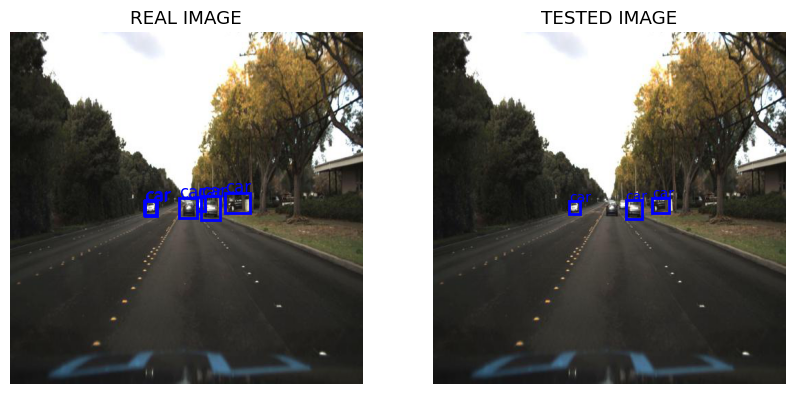

In [ ]:
%matplotlib inline
from PIL import Image
colors = ['red', 'blue', 'green', 'orange', 'purple', 'yellow', 'cyan', 'magenta', 'gray', 'brown', 'pink']

# Open the image using PIL
image = Image.open(project_path + '/test/images/' + random_file)

# We creat the plot to visualize the real objects and another to see the detected objects
fig = plt.figure(figsize=(10, 5))
axs = fig.subplots(1, 2)

# Real image
random_file_txt = random_file.replace(".jpg",".txt")
columns = ['class', 'center_x', 'center_y', 'dist_x', 'dist_y']
df = pd.read_csv(project_path + '/test/labels/' + random_file_txt, delimiter=' ', names=columns)

classes = ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']

axs[0].imshow(image)
axs[0].set_title('REAL IMAGE')
axs[0].axis('off')

if len(df) > 0:
  width, height = image.size
  for i in range(len(df)):
    xmin = (df['center_x'][i] - df['dist_x'][i]/2) * width
    ymin = (df['center_y'][i] - df['dist_y'][i]/2) * height
    x = df['dist_x'][i] * width
    y = df['dist_y'][i] * height
    rect = plt.Rectangle((xmin, ymin), x, y, edgecolor=colors[df['class'][i]], linewidth=2, facecolor='none')
    axs[0].add_patch(rect)
    text_x = xmin
    text_y = ymin - 0.1
    axs[0].text(text_x, text_y, classes[df['class'][i]], fontsize=12, color=colors[df['class'][i]])
else:
  print("No objects.")

# Image tested
%time
detections = model_augmentation(image).pandas().xyxy[0]
axs[1].imshow(image)
axs[1].set_title('TESTED IMAGE')
axs[1].axis('off')

if len(detections) > 0:
  for i in range(len(detections)):
    xmin = detections['xmin'][i]
    ymin = detections['ymin'][i]
    xmax = detections['xmax'][i]
    ymax = detections['ymax'][i]

    rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, edgecolor=colors[detections['class'][i]], linewidth=2, facecolor='none')
    axs[1].add_patch(rect)

    text_x = xmin
    text_y = ymin - 0.1
    axs[1].text(text_x, text_y, detections['name'][i], fontsize=10, color=colors[detections['class'][i]])
else:
  print("No detection.")

plt.show()

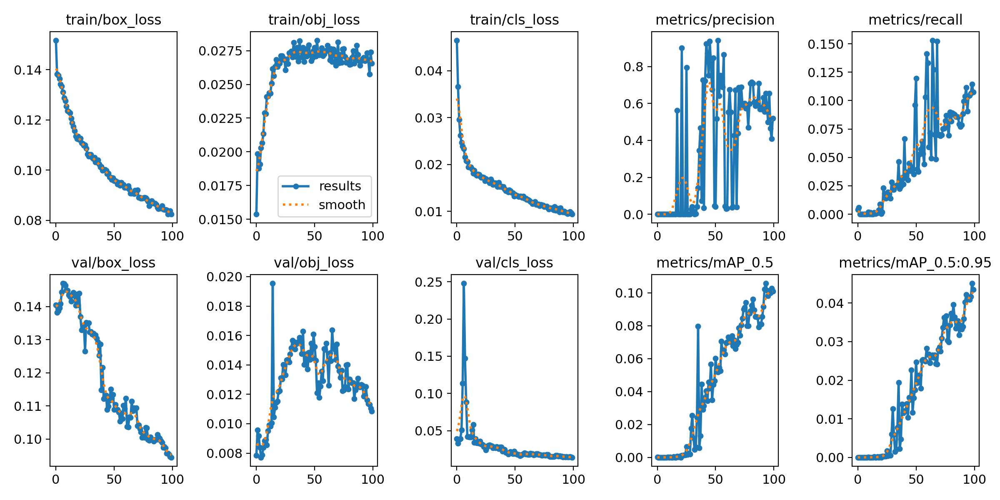

In [ ]:
from IPython.display import Image  # to display images

plot_results(file = '/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_augmentation_adam/results.csv')
Image(filename='/content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/runs/train/yolov5s_results_augmentation_adam/results.png', width = 1000)

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/
!python detect.py --weights runs/train/yolov5s_results_augmentation_adam/weights/best.pt --img 224 --source ../test/images

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5
detect: weights=['runs/train/yolov5s_results_augmentation_adam/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[224, 224], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-178-ga199480 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7273488 parameters, 0 gradients
image 1/538 /content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/test/images/1478020836210658259_jpg.rf.a39f0e2f012c51fdc2e5963e8

## TENSOR BOARD

In [ ]:
%cd /content/drive/MyDrive/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5/
%reload_ext tensorboard
%tensorboard --logdir runs

/content/drive/.shortcut-targets-by-id/1S3SbGCbIF8clS1Bm5iwUXUeYF15vyF3L/DeepLearning_2023/FinalProject_DeepLearning2023/yolov5


<IPython.core.display.Javascript object>

# SCRATCH YOLO

In [ ]:
from PIL import Image

In [ ]:
class ObjectDetectionDataLoader(Dataset):
    def __init__(self, image_paths, label_paths, device, transform=None):
        self.image_paths = image_paths
        self.label_paths = label_paths
        self.device = device
        self.transform = transform

    def load_labels(self, label_path):
        labels = []
        bbox = []
        with open(label_path, 'r') as file:
            for line in file:
                class_id, x, y, width, height = map(float, line.split())
                labels.append(int(class_id))
                bbox.append((x, y, width, height))
        return labels, bbox

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, index):
        image_path = self.image_paths[index]
        label_path = self.label_paths[index]

        image = Image.open(image_path)
        label, bbox = self.load_labels(label_path)

        if self.transform is not None:
            image = self.transform(image).unsqueeze(dim=0).to(self.device)
        labels = torch.tensor(label).long().to(self.device)
        bbox = torch.tensor(bbox).float().to(self.device)

        return image, labels, bbox

In [ ]:
image_folder = data_path + 'images/*.jpg'
label_folder = data_path + 'labels/*.txt'

tr = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        ])
num_samples_ = 5000
image_paths = []
label_paths = []

while image_paths == []:
    image_paths = glob.glob(image_folder)[:num_samples_]

while label_paths == []:
    label_paths = glob.glob(label_folder)[:num_samples_]

In [ ]:
dataset = ObjectDetectionDataLoader(image_paths, label_paths, torch.device('cuda:0' if torch.cuda.is_available() else 'cpu'), transform=tr)

In [ ]:
data_loader = DataLoader(dataset, batch_size=256, shuffle = True, num_workers=2, pin_memory = True)

torch.Size([1, 3, 224, 224])


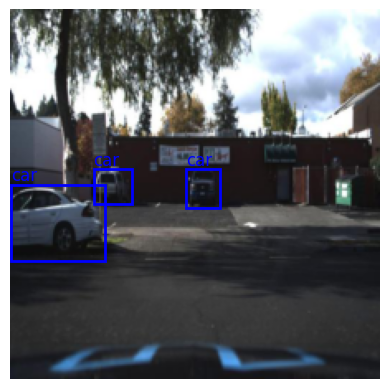

In [ ]:
classes = ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']
colors = ['red', 'blue', 'green', 'orange', 'purple', 'yellow', 'cyan', 'magenta', 'gray', 'brown', 'pink']

# EXAMPLE OF ONE OF THE IMAGES THAT WE ARE GOING TO USE TO TRAIN AND TEST:
num_samples = len(data_loader.dataset)
random_index = random.randint(0, num_samples - 1)

# Mini-batch images
random_ =  data_loader.dataset[random_index]
image = random_[0].cpu()
label = random_[1]
bbox = random_[2].cpu()

print(image.shape)

plt.imshow(image.permute(0,2,3,1).squeeze().numpy())
plt.axis('off')

original_width = image.permute(0, 2, 3, 1).squeeze().shape[1]
original_height = image.permute(0, 2, 3, 1).squeeze().shape[0]

for i in range(len(label)):
    rect = plt.Rectangle(((bbox[i][0] - bbox[i][2]/2) * original_width, (bbox[i][1] - bbox[i][3]/2) * original_height), bbox[i][2] * original_width, bbox[i][3] * original_height, edgecolor=colors[label[i]], linewidth=2, facecolor='none')
    plt.gca().add_patch(rect)
    text_x = (bbox[i][0] - bbox[i][2]/2) * original_width
    text_y = (bbox[i][1] - bbox[i][3]/2 - 0.01) * original_height
    plt.text(text_x, text_y, classes[label[i].item()], fontsize=12, color=colors[label[i]])

plt.show()

In [ ]:
num_images = len(data_loader.dataset)
train_indices = random.sample(range(num_images), int(0.8 * num_images))
test_indices = list(set(range(num_images)) - set(train_indices))

# Obtener los conjuntos de entrenamiento y prueba a partir del DataLoader
train_data = [data_loader.dataset[i] for i in train_indices]
test_data = [data_loader.dataset[i] for i in test_indices]

In [ ]:
# Implementamos una versión de YOLO con una estructura similar a la que hemos visto anteriormente

class Focus(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=1):
        super(Focus, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=kernel_size // 2)
        self.bn = nn.BatchNorm2d(out_channels)
        self.act = nn.LeakyReLU(0.1)

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        x = self.act(x)
        return x

class BottleneckCSP(nn.Module):
    def __init__(self, in_channels, out_channels, n=1, shortcut=True):
        super(BottleneckCSP, self).__init__()
        hidden_channels = int(out_channels / 2)

        self.conv1 = nn.Conv2d(in_channels, hidden_channels, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn1 = nn.BatchNorm2d(hidden_channels)
        self.act = nn.LeakyReLU(0.1)
        self.conv2 = nn.Conv2d(in_channels, hidden_channels, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn2 = nn.BatchNorm2d(hidden_channels)

        self.conv3 = nn.Conv2d(hidden_channels, hidden_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn3 = nn.BatchNorm2d(hidden_channels)

        self.conv4 = nn.Conv2d(hidden_channels, hidden_channels, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn4 = nn.BatchNorm2d(hidden_channels)

        self.conv5 = nn.Conv2d(hidden_channels * 2, out_channels, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn5 = nn.BatchNorm2d(out_channels)

        self.shortcut = shortcut
        if self.shortcut:
            self.shortcut_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0, bias=False)
            self.shortcut_bn = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        short = x
        x = self.act(self.bn1(self.conv1(x)))
        route = self.act(self.bn2(self.conv2(short)))
        x = self.act(self.bn3(self.conv3(route)))
        x = self.act(self.bn4(self.conv4(x)))
        x = torch.cat((x, route), dim=1)
        x = self.act(self.bn5(self.conv5(x)))

        if self.shortcut:
            short = self.shortcut_bn(self.shortcut_conv(short))

        x += short
        return x

class SPP(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_sizes=[5, 9, 13]):
        super(SPP, self).__init__()
        hidden_channels = int(out_channels / 2)

        self.conv1 = nn.Conv2d(in_channels, hidden_channels, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn1 = nn.BatchNorm2d(hidden_channels)
        self.act = nn.LeakyReLU(0.1)
        self.maxpools = nn.ModuleList([
            nn.MaxPool2d(kernel_size=kernel_size, stride=1, padding=kernel_size // 2)
            for kernel_size in kernel_sizes
        ])
        self.conv2 = nn.Conv2d(hidden_channels * len(kernel_sizes), hidden_channels, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn2 = nn.BatchNorm2d(hidden_channels)

        self.conv3 = nn.Conv2d(hidden_channels * 2, out_channels, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn3 = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        x1 = self.act(self.bn1(self.conv1(x)))
        x2 = [maxpool(x1) for maxpool in self.maxpools]
        x2 = torch.cat(x2, dim=1)
        x2 = self.act(self.bn2(self.conv2(x2)))
        x = torch.cat((x1, x2), dim=1)
        x = self.act(self.bn3(self.conv3(x)))
        return x

class YOLOv5(nn.Module):
    def __init__(self, num_classes, anchors):
        super(YOLOv5, self).__init__()
        self.num_classes = num_classes
        self.num_anchors = len(anchors)
        self.num_attrib = num_classes + 5
        self.anchor_vec = torch.tensor(anchors).float().view(self.num_anchors, 3, 2)

        self.backbone = nn.Sequential(
            Focus(3, 64, kernel_size=3),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            BottleneckCSP(128, 128),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            BottleneckCSP(256, 256),
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            BottleneckCSP(512, 512),
            nn.Conv2d(512, 1024, kernel_size=3, stride=2, padding=1),
            SPP(1024, 1024),
            BottleneckCSP(1024, 1024, n=3, shortcut=False)
        )

        self.head = nn.Sequential(
            nn.Conv2d(1024, 512, kernel_size=1, stride=1, padding=0),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            Concat(1),
            BottleneckCSP(512, 512, shortcut=False),
            nn.Conv2d(512, 256, kernel_size=1, stride=1, padding=0),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            Concat(1),
            BottleneckCSP(256, 256, shortcut=False),
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            Concat(1),
            BottleneckCSP(512, 512, shortcut=False),
            nn.Conv2d(512, 48, kernel_size=3, stride=2, padding=1),
            Concat(1),
            BottleneckCSP(48, 48, shortcut=False),
            Detect(num_classes, anchors)
        )

    def forward(self, x):
        x = self.backbone(x)
        x = self.head(x)
        return x

class Concat(nn.Module):
    def __init__(self, dimension):
        super(Concat, self).__init__()
        self.dimension = dimension

    def forward(self, *x):
        return torch.cat(x, self.dimension)

class Detect(nn.Module):
    def __init__(self, num_classes, anchors):
        super(Detect, self).__init__()
        self.num_classes = num_classes
        self.num_anchors = len(anchors)
        self.num_attrib = num_classes + 5
        self.anchor_vec = torch.tensor(anchors).float().view(self.num_anchors, 6)

    def forward(self, x):
        batch_size, _, grid_size = x.size(0), x.size(1), x.size(2)

        prediction = (x.view(batch_size, self.num_anchors, self.num_attrib, grid_size, grid_size).permute(0, 1, 3, 4, 2).contiguous())

        grid_x = torch.arange(grid_size, dtype=torch.float, device=x.device).repeat(grid_size, 1).view(1, 1, grid_size, grid_size)
        grid_y = torch.arange(grid_size, dtype=torch.float, device=x.device).repeat(grid_size, 1).t().view(1, 1, grid_size, grid_size)

        x = torch.sigmoid(prediction[..., 0])  # Center x
        y = torch.sigmoid(prediction[..., 1])  # Center y
        w = prediction[..., 2]  # Width
        h = prediction[..., 3]  # Height
        obj_conf = torch.sigmoid(prediction[..., 4])  # Object confidence
        class_conf = torch.sigmoid(prediction[..., 5:])  # Class confidence

        pred_boxes = torch.zeros_like(prediction[..., :4])

        pred_boxes[..., 0] = x + grid_x
        pred_boxes[..., 1] = y + grid_y

        anchor1 = self.anchor_vec[..., 2].view(1, 3, 1, 1).to(device)
        pred_boxes[..., 2] = torch.exp(w) * anchor1
        anchor2 = self.anchor_vec[..., 3].view(1, 3, 1, 1).to(device)
        pred_boxes[..., 3] = torch.exp(h) * anchor2

        indices = obj_conf > 0.90

        output = torch.cat((pred_boxes[indices].view(batch_size, -1, 4),
                            obj_conf[indices].view(batch_size, -1, 1),
                            class_conf[indices].view(batch_size, -1, self.num_classes)), -1)

        return output

num_classes = 11

anchors = [
    [10, 13, 16, 30, 33, 23],   # P3/8
    [30, 61, 62, 45, 59, 119],  # P4/16
    [116, 90, 156, 198, 373, 326]  # P5/32
]

model = YOLOv5(num_classes, anchors)

In [ ]:
# Define the loss function for YOLOv5

class YOLOv5Loss(nn.Module):
    def __init__(self, num_classes, anchors):
        super(YOLOv5Loss, self).__init__()
        self.num_classes = num_classes
        self.anchors = anchors
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.weights = [0.95720471, 0.53934233, 0.87422621, 0.94319605, 0.92952732, 0.99248578, 0.90524922, 0.9534476,  0.99558092, 0.99953483, 0.91020503]

        # Define your loss components here
        self.localization_loss = nn.SmoothL1Loss()
        self.confidence_loss = nn.BCEWithLogitsLoss()
        self.class_loss = nn.CrossEntropyLoss(weight=torch.tensor(self.weights).to(self.device), ignore_index=12)

    def forward(self, predictions, targets, labels_len):
        # Separate predictions into localization, confidence, and class predictions
        pred_boxes = predictions[:, :, :4]
        pred_confidences = predictions[:, :, 4]
        pred_classes = predictions[:, :, 5:].permute(0,2,1)

        # Separate targets into bounding box coordinates, objectness scores, and class labels
        target_boxes = targets[:, :, :4].to(torch.float32)
        target_confidences = targets[:, :, 4].to(torch.float32)
        target_classes = targets[:, :, 5]

        # Calculate localization loss
        loc_loss = self.localization_loss(pred_boxes, target_boxes)

        # Calculate confidence loss
        conf_loss = self.confidence_loss(pred_confidences, target_confidences)

        # Calculate class loss
        if(labels_len==0):
            class_loss = torch.ones(1, dtype=torch.int64, device = device)
        else:
            class_loss = self.class_loss(pred_classes, target_classes.to(torch.int64))

        loss = loc_loss + conf_loss + class_loss

        return loss

In [ ]:
import torch.optim.lr_scheduler as lr_scheduler

def train(model, train_loader, optimizer, loss_fn, num_epochs=5, model_name='model.ckpt', device='cpu', losses_list=[]):
    model.train() # Set the model in train mode
    total_step = len(train_loader)

    # Define the learning rate scheduler
    scheduler = lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

    for epoch in range(num_epochs):
        loss_avg = 0
        nBatches = 0

        for i, (images, labels, bbox) in enumerate(train_loader):
            images = images
            labels = labels
            bbox = bbox
            labels_len = len(labels)
            outputs = model(images)

            if(outputs.size(1) >= len(labels)):         # CASO DONDE HAY MAS O IGUALES BBOXES PREDICHAS QUE REALES
                if (outputs.size(1) != 0):              # CASO DONDE HAY MÁS DE UNA PREDICCION
                    targets = torch.zeros_like(outputs, dtype=torch.int64).to(device)

                else:                                   # CASO DONDE HAY 0 PREDICCIONES
                    targets = torch.zeros((len(images), 1, 16), dtype=torch.int64).to(device)
                    targets = torch.add(targets, 1e-7)
                    zeros = torch.zeros(len(images), 1, 16).to(device)
                    zeros = torch.add(zeros, 1e-7)
                    outputs = torch.cat((outputs, zeros), dim=1).to(device)
            else:                                       # CASO DONDE HAY MAS REALES QUE PREDICHAS
                targets = torch.zeros((len(images), len(labels), 16), dtype=torch.int64).to(device)
                zeros = torch.zeros(len(images), len(labels) - outputs.size(1), 16).to(device)
                zeros = torch.add(zeros, 1e-7)
                outputs = torch.cat((outputs, zeros), dim=1).to(device)

            for j in range(len(images)):
                for k in range(len(labels)):
                  targets[j, k, :4] = bbox[k] * 224
                  targets[j, k, 4] = 1
                  targets[j, k, 5] = labels[k]
                if(outputs.size(1) >= len(labels)):
                    for k in range(outputs.size(1)-len(labels)):
                        targets[j, len(labels) + k, 5] = 12

            loss = loss_fn(outputs, targets, labels_len)

            # Realizar la retropropagación y actualizar los pesos del modelo
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            loss_avg += loss.cpu().item()
            nBatches += 1
            if (i+1) % 500 == 0:
                print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}'.format(epoch + 1, num_epochs, i+1 , total_step,loss_avg / nBatches))
                print(loss.cpu().item())
        print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}' .format(epoch+1, num_epochs, i+1 , total_step, loss_avg / nBatches))

        scheduler.step()

        losses_list = (loss_avg / total_step)
        torch.save(model.state_dict(), results_path+ '/' + model_name)
    return losses_list

In [ ]:
# Device configuration (choose GPU if it is available )
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

model = YOLOv5(num_classes, anchors).to(device)

# Define the loss function
loss_fn = YOLOv5Loss(num_classes, anchors)

#Initialize optimizer
learning_rate = .0001
optimizer = torch.optim.Adam(model.parameters(),lr = learning_rate)

num_epochs = 5

train_loss = train(model, train_data, optimizer, loss_fn, num_epochs, model_name='my_net.ckpt', device=device)

In [ ]:
def calculate_accuracy(all_pred_boxes, all_pred_labels, all_pred_scores, ground_truth_boxes, ground_truth_labels, iou_threshold):
    correct_predictions = 0
    total_predictions = 0

    for pred_boxes, pred_labels, pred_scores, gt_boxes, gt_labels in zip(all_pred_boxes, all_pred_labels, all_pred_scores, ground_truth_boxes, ground_truth_labels):
        if(len(gt_labels.size())>0):
          total_predictions += len(gt_labels)

        for pred_box, pred_label, pred_score in zip(pred_boxes, pred_labels, pred_scores):
            best_iou = 0
            best_match_idx = -1

            for i, gt_box in enumerate(gt_boxes):
                iou = calculate_iou(pred_box, gt_box)
                if iou > best_iou and iou >= iou_threshold:
                    best_iou = iou
                    best_match_idx = i

            if best_match_idx != -1 and pred_label == gt_labels[best_match_idx]:
                correct_predictions += 1
    if(total_predictions > 0):
      accuracy = correct_predictions / total_predictions
    elif(len(ground_truth_labels) > 0):
      accuracy = 0
    else:
      accuracy = 1

    return accuracy


def calculate_iou(boxA, boxB):
    # Calculate intersection coordinates
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Calculate intersection area
    intersection_area = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    # Calculate union area
    boxA_area = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxB_area = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    union_area = boxA_area + boxB_area - intersection_area

    # Calculate IoU
    iou = intersection_area / union_area
    return iou

In [ ]:
import cv2

def test_model(model, data, confidence_threshold, iou_threshold, device='cpu'):
    # Pass the image through the model
    all_pred_boxes = []
    all_pred_labels = []
    all_pred_scores = []
    all_accuracies = []
    confusion_matrix = np.zeros((num_classes+1, num_classes+1), dtype=int)
    with torch.no_grad():
        model.eval()
        for images, labels, bbox in data:
            images = images.to(device)
            labels = labels.type(torch.LongTensor).to(device)
            bbox = bbox.type(torch.FloatTensor).to(device)

            # get network predictions
            outputs = model(images)

            # Apply non-maximum suppression
            pred_boxes = []
            pred_scores = []
            pred_labels = []

            for output in outputs:
                boxes_ = output[:, :4]
                scores_ = output[:, 4]
                labels_ = torch.argmax(output[:, 5:], dim=1)

                # Apply confidence threshold
                mask = scores_ >= confidence_threshold
                boxes_mask = boxes_[mask]
                scores_mask = scores_[mask]
                labels_mask = labels_[mask]

                # Apply non-maximum suppression
                keep = torchvision.ops.nms(boxes_mask, scores_mask, iou_threshold)
                boxes_keep = boxes_mask[keep]
                scores_keep = scores_mask[keep]
                labels_keep = labels_mask[keep]

                pred_boxes.append(boxes_keep)
                pred_scores.append(scores_keep)
                pred_labels.append(labels_keep)

            # Update confusion matrix
            true_labels = labels.tolist()
            predicted_labels = torch.cat(pred_labels).tolist()

            for true_label, predicted_label in zip(true_labels, predicted_labels):
                confusion_matrix[true_label, predicted_label] += 1

            # Check for undetected objects (background class)
            for true_label in true_labels:
                if true_label not in predicted_labels:
                    confusion_matrix[true_label, num_classes] += 1  # Update background class count

            accuracy = calculate_accuracy(pred_boxes, pred_labels, pred_scores, bbox, labels, iou_threshold)
            all_accuracies.append(accuracy)
            all_pred_boxes.append(pred_boxes)
            all_pred_scores.append(pred_scores)
            all_pred_labels.append(pred_labels)

    return all_pred_boxes, all_pred_labels, all_pred_scores, sum(all_accuracies)/len(all_accuracies), confusion_matrix

In [ ]:
net = model
net.load_state_dict(torch.load(results_path + 'my_net.ckpt'))
pred_boxes, pred_labels, pred_scores, accuracy, cm = test_model(model, test_data, 0.6, 2, device)
cm = np.transpose(cm)

tensor([], dtype=torch.int64)


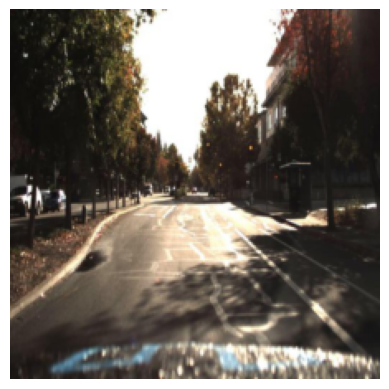

In [ ]:
num_samples = len(test_data)
random_index = random.randint(0, num_samples - 1)

plt.imshow(test_data[random_index][0].permute(0,2,3,1).squeeze().cpu().numpy())
plt.axis('off')
label = pred_labels[random_index][0].cpu()
bbox = pred_boxes[random_index][0].cpu()
print(label)

for i in range(len(label)):
    x = (bbox[i][0].item() - bbox[i][2].item() / 2)
    y = (bbox[i][1].item() - bbox[i][3].item() / 2)

    width = bbox[i][2].item()
    height = bbox[i][3].item()
    rect = plt.Rectangle((x, y), width, height, edgecolor=colors[label[i].item()], linewidth=2, facecolor='none')
    plt.gca().add_patch(rect)

    text_x = (bbox[i][0] - bbox[i][2]/2)
    text_y = (bbox[i][1] - bbox[i][3]/2 - 0.01)
    plt.text(text_x, text_y, classes[label[i].item()], fontsize=12, color=colors[label[i].item()])

plt.show()

<ipython-input-33-47a6275adf87>:5: RuntimeWarning: invalid value encountered in true_divide
  confusion_matrix_percentage = (cm / np.sum(cm, axis=0)) * 100


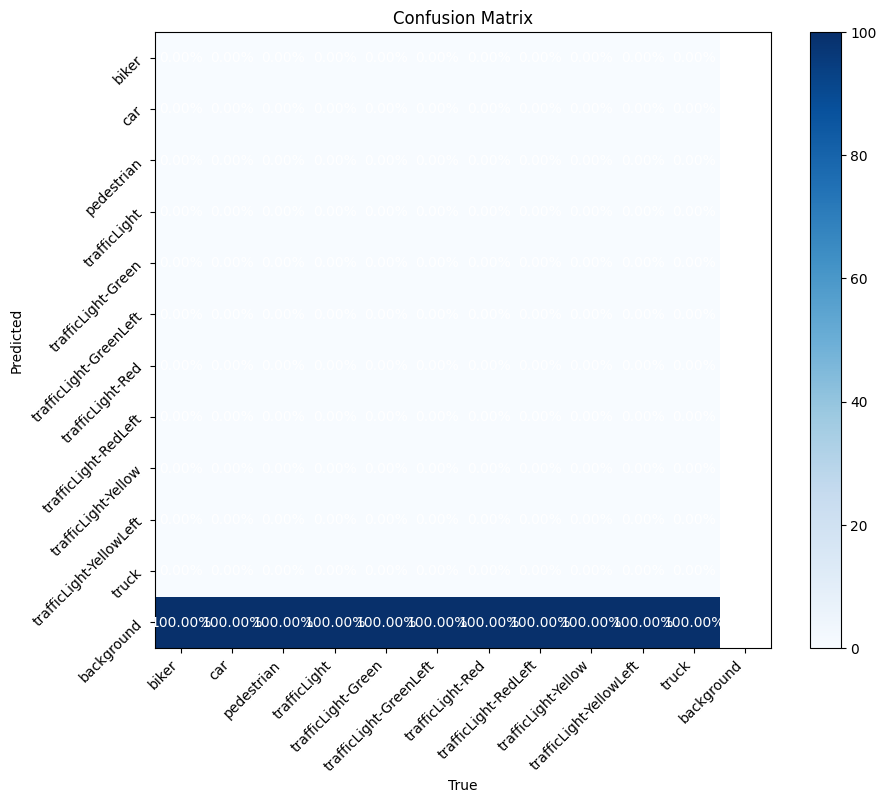

In [ ]:
# Calcular los porcentajes dividiendo cada valor por la suma de la columna y multiplicando por 100
names = classes.copy()
names.append('background')

confusion_matrix_percentage = (cm / np.sum(cm, axis=0)) * 100

fig, ax = plt.subplots(figsize=(10,8))
im = ax.imshow(confusion_matrix_percentage, cmap='Blues')

for i in range(len(confusion_matrix_percentage)):
    for j in range(len(confusion_matrix_percentage[0])):
        text = ax.text(j, i, f"{confusion_matrix_percentage[i, j]:.1f}%",
                       ha="center", va="center", color="w")

tick_marks = np.arange(12)
ax.set_xticks(np.arange(len(classes)))
ax.set_xticklabels(classes, rotation=45, ha='right')
ax.set_yticks(np.arange(len(names)))
ax.set_yticklabels(names, rotation=45, ha='right')

# Configurar el título y los ejes
plt.xlabel('True')
plt.ylabel('Predicted')
plt.title('Confusion Matrix')
plt.colorbar(im)

# Mostrar la figura
plt.show()